In [1]:
import h2o
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
from scipy import stats
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
from h2o.automl import H2OAutoML

# 导入并观察数据
train_df = pd.read_csv('../dataset/train.csv')
test_df = pd.read_csv('../dataset/test.csv')
train_df.shape, test_df.shape  # 样本数 x 特征维度

((47439, 41), (31626, 40))

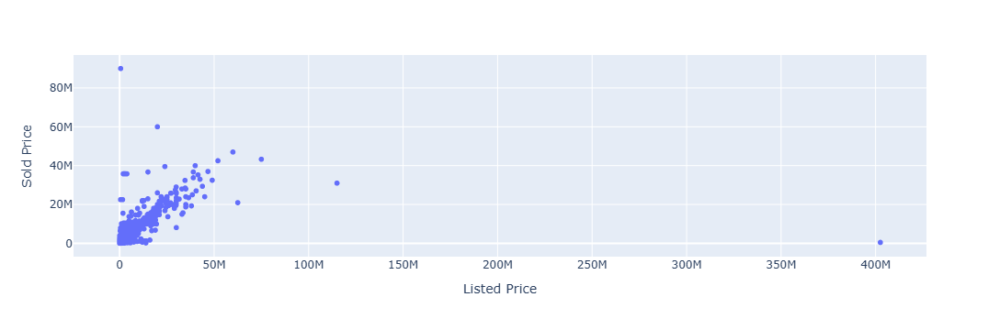

In [2]:
data = pd.concat([train_df['Sold Price'], train_df['Listed Price']], axis=1)  # 沿列方向合并数据
fig = px.scatter(data, x='Listed Price', y='Sold Price')  # 绘制散点图
fig.show()

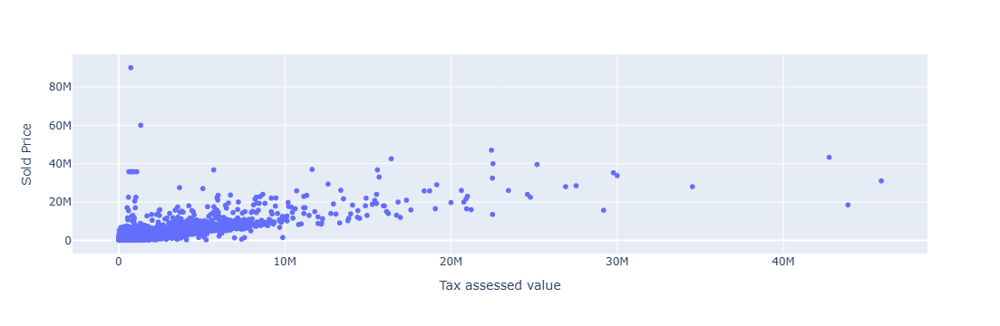

In [3]:
data = pd.concat([train_df['Sold Price'], train_df['Tax assessed value']], axis=1)
fig = px.scatter(data, x='Tax assessed value', y='Sold Price')
fig.show()

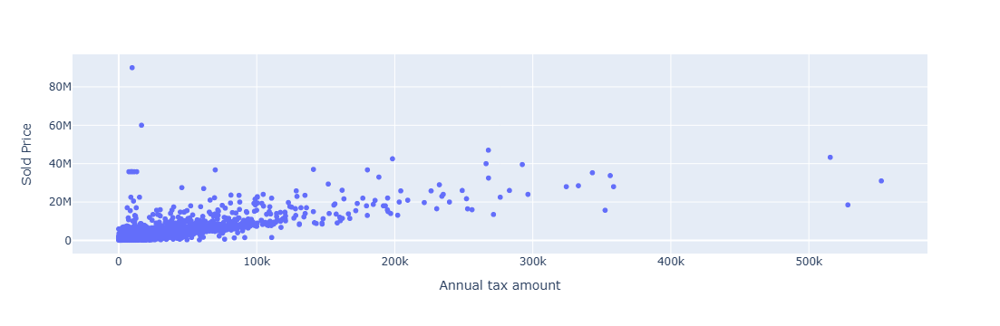

In [4]:
data = pd.concat([train_df['Sold Price'], train_df['Annual tax amount']], axis=1)
fig = px.scatter(data, x='Annual tax amount', y='Sold Price')
fig.show()

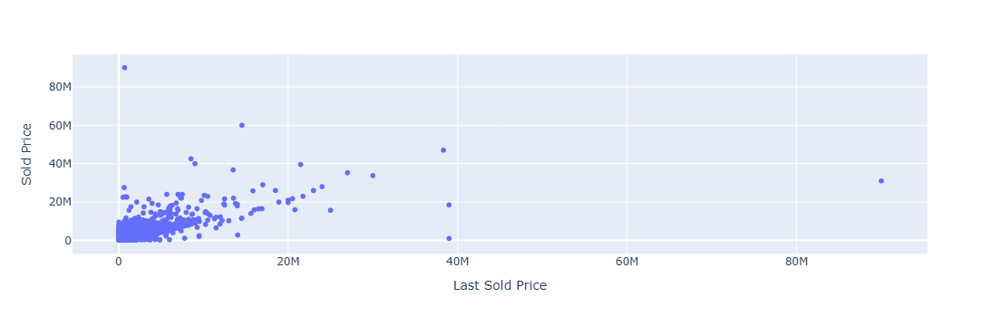

In [5]:
data = pd.concat([train_df['Sold Price'], train_df['Last Sold Price']], axis=1)
fig = px.scatter(data, x='Last Sold Price', y='Sold Price')
fig.show()

In [6]:
# 根据以上散点图，删除离群点
train_df = train_df.drop([3674, 6055, 32867, 34876, 43398, 44091, 44633])

In [7]:
# 将特征和标签（目标变量）分离

# 提取目标变量（标签）：房屋售价
y = train_df['Sold Price'].reset_index(drop=True)
# 说明：
#   train_df['Sold Price'] → 从训练数据集中提取售价列
#   reset_index(drop=True) → 重置索引并丢弃原索引（避免后续操作中的索引冲突）

# 创建训练特征集：移除目标变量后的训练数据
train_features = train_df.drop('Sold Price', axis=1)
# 说明：
#   drop('Sold Price', axis=1) → 删除"售价"列（axis=1表示按列删除）
#   此时train_features包含除售价外的所有特征

# 创建测试特征集：直接复制测试数据集
test_features = test_df.copy()
# 说明：
#   测试集本身不包含目标变量，直接复制即可
#   使用copy()确保创建的是独立副本，避免修改原始数据

# 合并训练集和测试集的特征
features = pd.concat([train_features, test_features]).reset_index(drop=True)
# 说明：
#   pd.concat([...]) → 沿行方向（默认axis=0）垂直合并两个数据集
#   reset_index(drop=True) → 重置索引并丢弃原索引（确保索引连续）

# 查看合并后的特征集形状
features.shape
# 说明：
#   输出合并后的特征集维度：(总行数, 特征列数)
#   总行数 = 训练集行数 + 测试集行数
#   特征列数 = 原始特征数量（不含目标变量）

(79058, 40)

In [8]:
# 初步处理数据 zip列应作为字符串 并对bedroom列作简单处理
def proc_bedroom(x):
    # 检查数据：非空且不是纯数字（说明包含额外文本）
    if not pd.isna(x) and not x.isdigit():
        # 使用逗号分割字符串（例如："2, Walk-in Closet" -> ['2', 'Walk-in Closet']）
        temp = x.split(',')
        
        # 计算分割后的元素数量（初步的卧室数量）
        n = len(temp)
        
        # 如果分割后的部分包含"Walk-in Closet"文本，则数量减1
        # （因为衣帽间不应计入卧室数量）
        if 'Walk-in Closet' in temp:  
            n -= 1
        
        return n  # 返回处理后的卧室数量
    else:
        # 如果是纯数字或空值，直接返回原始值
        return x

# 应用处理函数到Bedrooms列
features['Bedrooms'] = features['Bedrooms'].apply(lambda x: proc_bedroom(x))
"""
.apply()方法
    - Pandas的Series方法，对列中每个元素应用指定函数
    - 这里使用`lambda`函数将每个元素`x`传递给`proc_bedroom`函数处理
    - 高效替代循环操作，适合数据清洗场景
"""

# 将Bedrooms列转换为数值类型（处理后的字符串转为整数，NaN保持不变）
features['Bedrooms'] = pd.to_numeric(features['Bedrooms'])

# 将Zip列转换为字符串类型（确保邮编作为文本处理，避免数值截断问题）
features['Zip'] = features['Zip'].astype('str')

In [9]:
# 计算每个特征的缺失值总数
# isnull() 检测缺失值，返回布尔DataFrame
# sum() 对每列的True值（缺失值）求和
# sort_values(ascending=False) 按缺失值数量降序排列
total = features.isnull().sum().sort_values(ascending=False)

# 计算每个特征的缺失值百分比
percent = (total / len(features)) * 100

# 将两个Series合并为DataFrame
# 沿列轴(axis=1)连接，keys参数指定列名
missing_data = pd.concat([total, percent], axis=1)

# 重置索引（将原来的列名索引变成普通列）
missing_data = missing_data.reset_index()

# 重命名列
missing_data.columns = ['Name', 'Total', 'Percent']

# 显示缺失最严重的前10个特征
missing_data[:10]

,Name,Total,Percent
0,Cooling features,32115,40.622075
1,Cooling,30142,38.126439
2,Last Sold Price,29544,37.370032
3,Last Sold On,29544,37.370032
4,Middle School Score,28276,35.766146
5,Middle School,28274,35.763617
6,Middle School Distance,28274,35.763617
7,Appliances included,23751,30.042500
8,Lot,22987,29.076121
9,Flooring,21933,27.742923


In [10]:
def handle_missing(features):
    """
    处理数据集中缺失值的函数，针对不同类型的特征采用不同的填充策略
    
    参数:
        features: 包含特征的数据集（DataFrame）
        
    返回:
        处理缺失值后的数据集（DataFrame）
    """
    
    # 定义需要用0填充缺失值的特征列
    zero_fill = [
        'Last Sold Price', 'Lot', 'Full bathrooms', 'Annual tax amount', 
        'Tax assessed value', 'Bathrooms', 'Bedrooms', 
        'Total interior livable area', 'Total spaces', 'Garage spaces'
    ]
    
    # 定义需要用字符串'None'填充缺失值的特征列
    none_fill = [
        'Last Sold On', 'Middle School', 'Appliances included', 'Flooring', 
        'Laundry features', 'Cooling features', 'Cooling', 'Heating features', 
        'Heating', 'Elementary School', 'High School', 'Parking features', 
        'Parking', 'Summary'
    ]
    
    # 定义需要用该列最大值填充缺失值的特征列
    max_fill = [
        'Middle School Score', 'Middle School Distance', 
        'Elementary School Score', 'Elementary School Distance',
        'High School Score', 'High School Distance'
    ]
    
    # 定义需要用众数（mode）填充缺失值的特征列
    mode_fill = ['Year built', 'Region']
    
    # 对数值型特征用0填充缺失值
    for c in zero_fill:
        # 适合处理价格、面积、数量等数值特征
        # 缺失表示没有相关数值（如未售出、没有浴室等）
        features[c] = features[c].fillna(0)
    
    # 对学校相关特征用最大值填充缺失值
    for c in max_fill:
        # 适合处理距离和评分特征
        # 缺失值可能表示学校信息缺失，用最大值填充（最差情况）
        features[c] = features[c].fillna(features[c].max())
    
    # 对分类/文本特征用'None'填充缺失值
    for c in none_fill:
        # 适合处理日期、学校名称、设备描述等文本特征
        # 缺失表示没有相关信息
        features[c] = features[c].fillna('None')
    
    # 对类别型/时间型特征用众数填充缺失值
    for c in mode_fill:
        # 适合处理年份、地区等有明确常见值的特征
        # 取第一个众数（mode()[0]）因为众数可能有多个
        features[c] = features[c].fillna(features[c].mode()[0])
    
    return features

In [11]:
features = handle_missing(features)
features.shape

(79058, 40)

In [12]:
"""
房价数据通常呈现右偏分布：多数房屋集中在较低价格区间，少数高端房产形成长尾

对数变换能压缩极端值，使数据分布更接近正态分布
"""
y = np.log1p(y)  # log(1+x)

In [13]:
# 提取数值型特征列
numerical_columns = features.select_dtypes(include=['int64','float64']).columns
"""
作用：
  筛选DataFrame中所有数值类型的特征列（整数和浮点数）
说明：
  select_dtypes(include=['int64','float64']) → 选择指定数据类型的列
  .columns → 获取这些列的名称（返回Index对象）
结果：
  数值特征列名称列表，例如 ['Lot', 'Bedrooms', 'Bathrooms', ...]
"""

# 计算各数值特征的偏度并排序
skewed_features = features[numerical_columns].apply(lambda x: stats.skew(x)).sort_values(ascending=False)
"""
作用：
  计算每个数值特征的偏度(skewness)并按降序排列
分步解析：
  1. features[numerical_columns] → 选择所有数值特征组成的子DataFrame
  2. .apply(lambda x: stats.skew(x)) → 对每列应用偏度计算函数
      - stats.skew(x) 计算分布的偏度
      - 偏度>0：右偏分布（峰值在左，长尾在右）
      - 偏度<0：左偏分布（峰值在右，长尾在左）
  3. .sort_values(ascending=False) → 按偏度值降序排序（最严重的右偏排在最前）
结果：
  返回一个Series，索引为特征名，值为对应的偏度值，按偏度严重程度排序
"""

# 创建偏度分析数据框
skewness = pd.DataFrame({'Skew value' :skewed_features})
"""
作用：
  将偏度分析结果转换为DataFrame便于查看
说明：
  创建包含单列'Skew value'的DataFrame
  索引为特征名称，列值为偏度值
"""

# 显示偏度最大的前20个特征
skewness.head(20)

,Skew value
Total interior livable area,281.156484
Garage spaces,170.008855
Total spaces,167.692773
Lot,102.909470
Annual tax amount,15.983229
Listed Price,12.216883
Tax assessed value,10.752594
Last Sold Price,10.187426
High School Distance,2.749617
Elementary School Distance,2.481876


In [14]:
def fix_skew(features):
    """
    此函数接收一个DataFrame，返回经过偏度校正的DataFrame
    功能：对高偏度的数值特征进行Box-Cox变换，使其分布更接近正态分布
    """
    
    ## 获取所有非对象类型的数据（数值型特征）
    numerical_columns = features.select_dtypes(include=['int64','float64']).columns
    """
    作用：筛选出所有数值型特征列（整数和浮点数）
    说明：只处理数值特征，忽略类别型特征
    """

    # 检查所有数值特征的偏度
    skewed_features = features[numerical_columns].apply(lambda x: stats.skew(x)).sort_values(ascending=False)
    """
    步骤：
      1. 对每个数值特征计算偏度
      2. 按偏度值降序排列（最严重的偏斜排在最前）
    结果：包含所有数值特征偏度值的Series
    """

    # 筛选高偏度特征（|偏度|>0.5）
    high_skew = skewed_features[abs(skewed_features) > 0.5]
    """
    标准：通常选择偏度绝对值大于0.5作为需要处理的特征
    说明：这个阈值可根据数据特性调整，0.5是常用经验值
    """

    # 获取高偏度特征列名
    skewed_features = high_skew.index
    """
    结果：需要处理的偏斜特征名称列表
    """

    # 执行Box-Cox变换
    for column in skewed_features:
        # 对每个高偏度特征应用Box-Cox变换
        features[column] = boxcox1p(features[column], boxcox_normmax(features[column] + 1))
        """
        Box-Cox变换详解：
          1. boxcox_normmax(): 计算最优的lambda变换参数
          2. boxcox1p(): 应用Box-Cox变换的稳定版本（处理零值和负数）
          3. 公式：boxcox1p(x, λ) = [(x+1)^λ - 1]/λ  (当λ≠0)
                                  = log(x+1)  (当λ=0)
        
        为何使用+1？
          - 处理包含零值的特征（log(0)未定义）
          - 确保所有值>0（Box-Cox变换的基本要求）
        """
        
    return features  # 返回处理后的DataFrame

In [15]:
def reset_zero(x):
    return max(x,0)
    
features['Garage spaces'] = features['Garage spaces'].apply(lambda x: reset_zero(x))  # 确保车库空间值非负
features['Total spaces'] = features['Total spaces'].apply(lambda x: reset_zero(x))  # 确保总空间值非负
features = fix_skew(features)  # 应用偏度校正函数到整个数据集
features.head()

,Id,Address,Summary,Type,Year built,Heating,Cooling,Parking,Lot,Bedrooms,...,Parking features,Tax assessed value,Annual tax amount,Listed On,Listed Price,Last Sold On,Last Sold Price,City,Zip,State
0,0,540 Pine Ln,"540 Pine Ln, Los Altos, CA 94022 is a single f...",SingleFamily,15119.693340,"Heating - 2+ Zones, Central Forced Air - Gas","Multi-Zone, Central AC, Whole House / Attic Fan","Garage, Garage - Attached, Covered",0.726817,2.872963,...,"Garage, Garage - Attached, Covered",371.975397,82.746240,2019-10-24,80.119553,None,0.000000,Los Altos,94022,CA
1,1,1727 W 67th St,"HURRY, HURRY.......Great house 3 bed and 2 bat...",SingleFamily,14690.880657,Combination,"Wall/Window Unit(s), Evaporative Cooling, See ...","Detached Carport, Garage",15.385002,2.271049,...,"Detached Carport, Garage",303.655567,63.530064,2019-10-16,53.478519,2019-08-30,476.388912,Los Angeles,90047,CA
2,2,28093 Pine Ave,'THE PERFECT CABIN TO FLIP! Strawberry deligh...,SingleFamily,15009.723924,Forced air,None,0 spaces,18.048405,1.615347,...,None,130.862842,23.052044,2019-08-25,43.175690,None,0.000000,Strawberry,95375,CA
3,3,10750 Braddock Dr,Rare 2-story Gated 5 bedroom Modern Mediterran...,SingleFamily,14899.941828,Central,Central Air,"Detached Carport, Driveway, Garage - Two Door",0.000000,3.435215,...,"Detached Carport, Driveway, Garage - Two Door",477.611531,99.906213,2019-10-24,68.741731,2016-08-30,900.161417,Culver City,90230,CA
4,4,7415 O Donovan Rd,Beautiful 200 acre ranch land with several pas...,VacantLand,15631.978198,None,None,0 spaces,0.000000,0.000000,...,None,0.000000,0.000000,2019-06-07,66.482832,2016-06-27,726.987492,Creston,93432,CA


In [16]:
# 将 features 分离 根据 Variable Importances 进行挑选
x = features.iloc[:len(y), :]
x_test = features.iloc[len(y):, :]
x.shape, y.shape, x_test.shape

((47432, 40), (47432,), (31626, 40))

In [17]:
selected=['Listed Price','Tax assessed value','Annual tax amount','Listed On','Elementary School Distance','Last Sold On',
'Zip','Total interior livable area','Last Sold Price','Lot','Year built','Bathrooms','High School Distance',
'Elementary School Score','Full bathrooms','Middle School Distance','Heating features','Bedrooms',
'Elementary School','Laundry features','Region','Middle School Score','Type',
'Total spaces','High School Score','Parking']

x = x[selected]
x_test = x_test[selected + ['Id']]
x.head()

,Listed Price,Tax assessed value,Annual tax amount,Listed On,Elementary School Distance,Last Sold On,Zip,Total interior livable area,Last Sold Price,Lot,...,Heating features,Bedrooms,Elementary School,Laundry features,Region,Middle School Score,Type,Total spaces,High School Score,Parking
0,80.119553,371.975397,82.746240,2019-10-24,0.247374,None,94022,0.756170,0.000000,0.726817,...,"Forced air, Gas",2.872963,Santa Rita Elementary School,"Washer / Dryer, Inside, In Utility Room",Los Altos,10.0,SingleFamily,0.000000,8.0,"Garage, Garage - Attached, Covered"
1,53.478519,303.655567,63.530064,2019-10-16,0.351259,2019-08-30,90047,17.557621,476.388912,15.385002,...,Combination,2.271049,Raymond Avenue Elementary School,Inside,Los Angeles,2.0,SingleFamily,0.687612,2.0,"Detached Carport, Garage"
2,43.175690,130.862842,23.052044,2019-08-25,0.517167,None,95375,19.097368,0.000000,18.048405,...,Forced air,1.615347,None,None,Strawberry,10.0,SingleFamily,0.000000,10.0,0 spaces
3,68.741731,477.611531,99.906213,2019-10-24,0.153660,2016-08-30,90230,24.291660,900.161417,0.000000,...,Central,3.435215,Farragut Elementary School,"Stackable, Upper Level",Culver City,7.0,SingleFamily,0.000000,8.0,"Detached Carport, Driveway, Garage - Two Door"
4,66.482832,0.000000,0.000000,2019-06-07,0.510700,2016-06-27,93432,0.000000,726.987492,0.000000,...,None,0.000000,Santa Margarita Elementary School,None,Creston,5.0,VacantLand,0.000000,6.0,0 spaces


In [18]:
# 初始化H2O集群
h2o.init()
"""
作用：启动本地H2O集群实例
说明：
  1. 创建内存中的分布式计算环境
  2. 自动检测可用CPU和内存资源
  3. 在本地启动一个H2O服务器进程
重要参数（可添加）：
  - nthreads: 指定使用CPU核心数（默认使用所有可用核心）
  - max_mem_size: 指定最大内存使用量（如'max_mem_size="8G"'）
"""

# 创建H2O训练数据集
hf = h2o.H2OFrame(pd.concat([x, y], axis=1))
"""
作用：将Pandas DataFrame转换为H2OFrame格式
分解：
  1. pd.concat([x, y], axis=1) → 将特征x和目标变量y水平合并
     - x: 训练特征DataFrame
     - y: 目标变量Series
     - 结果：包含特征和目标列的完整训练数据集
  
  2. h2o.H2OFrame(...) → 将合并后的Pandas DataFrame转换为H2O专用数据结构
特点：
  - 保留列名和数据类型
  - 数据被上传到H2O集群内存中
  - 支持分布式处理
注意：此操作会将数据从Python内存复制到H2O集群内存
"""

# 创建H2O测试数据集
x_test_hf = h2o.H2OFrame(x_test)
"""
作用：将测试集特征转换为H2OFrame格式
说明：
  - x_test: 测试集特征DataFrame
  - 仅包含特征列，不包含目标变量
  - 数据结构与训练集特征部分一致
重要提示：测试集必须与训练集有完全相同的特征列（顺序和名称）
"""

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,1 hour 24 mins
H2O_cluster_timezone:,Asia/Shanghai
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.7
H2O_cluster_version_age:,2 months and 22 days
H2O_cluster_name:,H2O_from_python_a_ti2mks
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,14.63 Gb
H2O_cluster_total_cores:,28
H2O_cluster_allowed_cores:,28
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


'\n作用：将测试集特征转换为H2OFrame格式\n说明：\n  - x_test: 测试集特征DataFrame\n  - 仅包含特征列，不包含目标变量\n  - 数据结构与训练集特征部分一致\n重要提示：测试集必须与训练集有完全相同的特征列（顺序和名称）\n'

In [19]:
print(f"H2O 版本: {h2o.__version__}")
print(f"可用方法: {dir(h2o)}")  # 应该能看到 init 方法

H2O 版本: 3.46.0.7
可用方法: ['H2OFrame', '__all__', '__buildinfo__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__no_export', '__package__', '__path__', '__spec__', '__version__', '_here', '_init_', '_read_txt_from_whl', 'api', 'as_list', 'assign', 'automl', 'backend', 'base', 'cluster', 'cluster_info', 'cluster_status', 'connect', 'connection', 'create_frame', 'deep_copy', 'demo', 'display', 'download_all_logs', 'download_csv', 'download_model', 'download_pojo', 'enable_expr_optimizations', 'estimate_cluster_mem', 'estimators', 'exceptions', 'export_file', 'expr', 'expr_optimizer', 'f', 'flow', 'frame', 'frames', 'get_frame', 'get_grid', 'get_model', 'get_timezone', 'grid', 'group_by', 'h2o', 'import_file', 'import_hive_table', 'import_mojo', 'import_sql_select', 'import_sql_table', 'init', 'interaction', 'is_expr_optimizations_enabled', 'job', 'lazy_import', 'list_timezones', 'load_dataset', 'load_frame', 'load_grid', 'load_model', 'log_and_echo', 'ls'

In [20]:
predictors = hf.drop('Sold Price').columns  # 提取预测变量（特征）列表
response = 'Sold Price'  # 定义响应变量（目标变量）

In [21]:
# 设置AutoML训练参数
aml = H2OAutoML(
    max_models=30,  # 最大模型数量限制
    max_runtime_secs=9000,  # 最大运行时间（秒）9000秒=2.5小时
    stopping_metric='RMSLE',  # 早停评估指标
    sort_metric='RMSLE',  # 模型排序指标
)

In [22]:
# 训练AutoML模型
aml.train(
    x=predictors,          # 特征列名称列表
    y=response,            # 目标变量列名
    training_frame=hf      # 训练数据集(H2OFrame格式)
)

AutoML progress: |█
11:14:23.861: AutoML: XGBoost is not available; skipping it.

██████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),22/30
# GBM base models (used / total),13/14
# DRF base models (used / total),2/2
# DeepLearning base models (used / total),7/13
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [23]:
lb = aml.leaderboard;  # 获取模型排行榜
lb

model_id,rmsle,rmse,mse,mae,mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_4_20250619_111423,0.0129766,0.187112,0.0350111,0.0881106,0.0350111
StackedEnsemble_BestOfFamily_1_AutoML_4_20250619_111423,0.0130485,0.188222,0.0354275,0.0879936,0.0354275
GBM_grid_1_AutoML_4_20250619_111423_model_8,0.013301,0.191595,0.0367086,0.0932944,0.0367086
GBM_3_AutoML_4_20250619_111423,0.0133022,0.191658,0.0367328,0.091599,0.0367328
GBM_2_AutoML_4_20250619_111423,0.0134746,0.19423,0.0377253,0.0979951,0.0377253
GBM_4_AutoML_4_20250619_111423,0.0134946,0.194553,0.037851,0.097032,0.037851
GBM_1_AutoML_4_20250619_111423,0.0135491,0.195907,0.0383796,0.0956042,0.0383796
DRF_1_AutoML_4_20250619_111423,0.0135885,0.196093,0.0384526,0.0957328,0.0384526
XRT_1_AutoML_4_20250619_111423,0.013591,0.196315,0.0385395,0.0944954,0.0385395
GBM_grid_1_AutoML_4_20250619_111423_model_3,0.0136163,0.196463,0.0385977,0.0986246,0.0385977


In [24]:
aml.leader  # 获取表现最好的单一模型

key,value
Stacking strategy,cross_validation
Number of base models (used / total),22/30
# GBM base models (used / total),13/14
# DRF base models (used / total),2/2
# DeepLearning base models (used / total),7/13
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [25]:
# 读取提交结果模板
"""
作用：加载提交结果模板文件
说明：
  - 该文件包含两列：'Id'和'Sold Price'
  - 'Sold Price'列需要填充预测值
  - 文件结构示例：
        Id    Sold Price
        0     0.0
        1     0.0
        ...   ...
"""
submission_results = pd.read_csv("../dataset/submission_sample.csv")

In [26]:
# 定义Top-K模型平均预测函数
def top_k_avg_predict(k, leaderboard):
    """
    使用排行榜前K个模型进行集成预测
    
    参数:
        k: 要集成的模型数量
        leaderboard: AutoML生成的模型排行榜
        
    返回:
        测试集预测结果（原始价格尺度）
    """
    # 将H2O排行榜转换为Pandas DataFrame
    lb = leaderboard.as_data_frame(use_multi_thread=True)
    """
    说明：
      - as_data_frame()：将H2OFrame转换为Pandas DataFrame
      - use_multi_thread=True：使用多线程加速转换
      - lb结构：包含模型ID、性能指标等
    """
    
    # 初始化预测结果（使用模板中的占位值）
    ans = submission_results.iloc[:, 1]
    """
    说明：
      - submission_results.iloc[:, 1]：获取模板中'Sold Price'列
      - 初始值为0.0（模板中的占位值）
    """
    
    # 遍历前K个模型
    for i in range(k):
        # 获取当前模型ID
        model = lb.loc[i]['model_id']
        
        # 使用当前模型进行预测
        pred = h2o.get_model(model).predict(x_test_hf)
        """
        说明：
          - h2o.get_model()：根据ID加载模型
          - .predict()：对测试集进行预测
          - 预测结果是对数尺度（因为训练时y=np.log1p(y))
        """
        
        # 将预测结果转换为Pandas DataFrame
        pred = pred.as_data_frame(use_multi_thread=True)
        """
        说明：
          - as_data_frame()：H2OFrame转Pandas
          - 结果包含'predict'列（对数尺度预测值）
        """
        
        # 将对数预测值转换为原始价格尺度，并加权平均
        ans += np.expm1(pred['predict']) / k
        """
        关键步骤：
          1. np.expm1()：将对数预测值转换为原始价格
             - expm1(x) = e^x - 1 是log1p的逆运算
             - 公式：原始价格 = exp(预测值) - 1
          2. /k：计算等权重平均值
          3. 累加到ans：实现模型集成
        """
    
    return ans  # 返回集成预测结果

# 使用前8个模型进行集成预测
# submission_results.iloc[:, 1] = top_k_avg_predict(8, aml.leaderboard)
# """
# 作用：将模板中的占位值替换为真实预测值
# 说明：
#   - 选择排行榜前8个模型进行集成
#   - 集成方法：简单平均法
#   - 结果已转换为原始房价尺度
# """

In [27]:
# 忽略H2O的特定UserWarning
import warnings
warnings.filterwarnings("ignore", message="Test/Validation dataset column.*has levels not trained on")

# 定义Top-K模型基于RMSLE的倒数加权预测函数
def top_k_weighted_predict(k, leaderboard):
    lb = leaderboard.as_data_frame(use_multi_thread=True)
    ans = np.zeros(len(submission_results))
    
    # 提取前K个模型的RMSLE值
    rmsle_scores = lb['rmsle'].head(k).values
    weights = 1 / rmsle_scores  # RMSLE越小权重越大
    weights /= weights.sum()    # 归一化权重
    
    for i in range(k):
        model = lb.loc[i]['model_id']
        pred = h2o.get_model(model).predict(x_test_hf)
        pred = pred.as_data_frame(use_multi_thread=True)
        ans += weights[i] * np.expm1(pred['predict'])
    
    return ans

submission_results.iloc[:, 1] = top_k_weighted_predict(8, aml.leaderboard)

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Export File progress: |███████████████████████████

In [28]:
# 保存预测结果到CSV文件
"""
参数：
  - index=False：不保存行索引
说明：
  生成符合比赛要求的提交文件
"""
submission_results.to_csv('../dataset/submission_H2O.csv', index=False)

In [29]:
submission_results.head()  # 获取前5个预测结果

,Id,Sold Price
0,47439,8.324191e+05
1,47440,5.487581e+05
2,47441,8.664057e+05
3,47442,8.316125e+05
4,47443,1.107910e+06
